# Detection Training

## Import Packages

In [1]:
import matplotlib.patches as patches
from matplotlib import pyplot as plt
import numpy as np
import torchvision
import matplotlib
import random
import torch

## Data Preparation

In [2]:
import torchvision.transforms as transforms
from data.dataset import DetectionDataset
from torch.utils.data import DataLoader

1. Define data transforms and collate function

In [3]:
data_transforms = transforms.Compose([
    transforms.ToTensor()
])

def collate_fn(batch):
    return tuple(zip(*batch))

2. Load the dataset and create the dataloader

In [4]:
data_dir_train = "/Volumes/SLIDES/Slides/MIDOG 21/A/train"
data_dir_val = "/Volumes/SLIDES/Slides/MIDOG 21/A/valid"
annotation_dir = "/Volumes/SLIDES/Slides/MIDOG 21/MIDOG.json"
train_dataset = DetectionDataset(image_path=data_dir_train, anno_file_path= annotation_dir, num_per_slide = 1, patch_size = 512, ds_level = 0, transforms=data_transforms)
val_dataset = DetectionDataset(image_path=data_dir_val, anno_file_path= annotation_dir, num_per_slide = 1, patch_size = 512, ds_level = 0, transforms=data_transforms)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=False, num_workers=0, pin_memory=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=0, pin_memory=True, collate_fn=collate_fn)

3. Show slide annotations

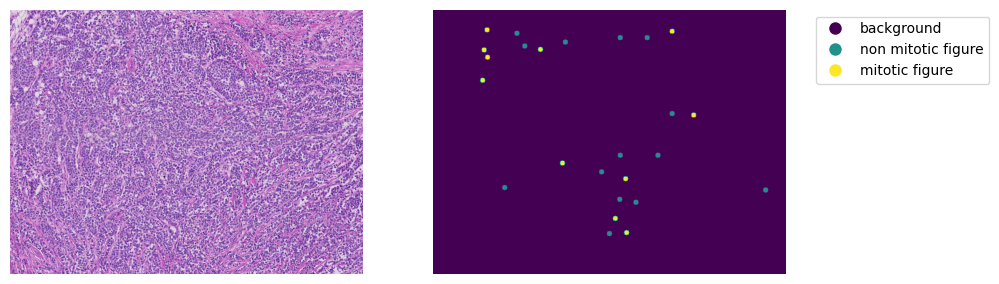

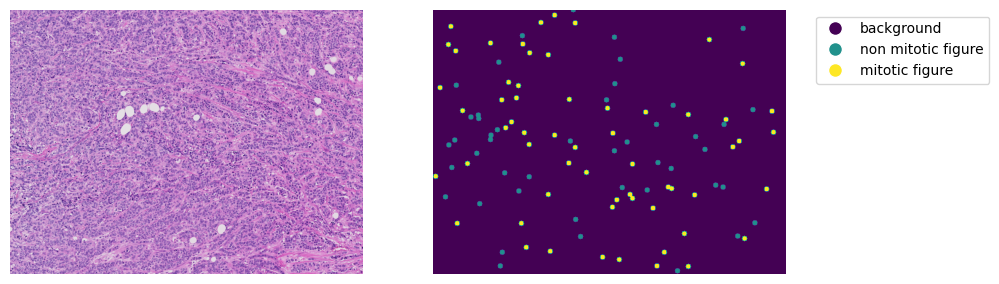

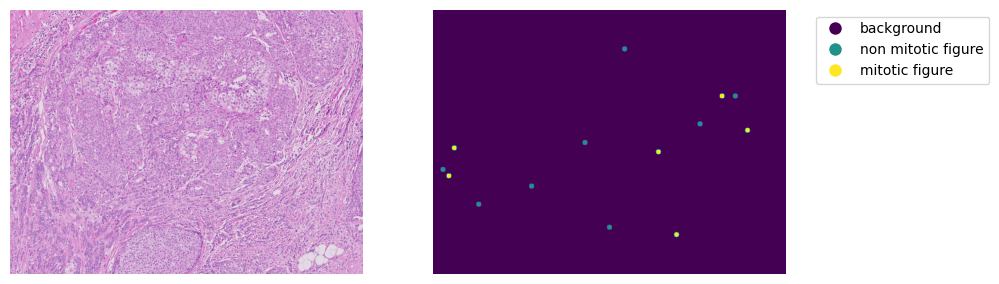

In [5]:
random_indices = random.sample(range(len(train_dataset)), 3)
classes = {'-1':'background', '0': 'non mitotic figure', '1': 'mitotic figure'}
norm = matplotlib.colors.Normalize(vmin=-1, vmax=1)
for idx in random_indices:
    map, thumb = train_dataset.__getoverview__(idx)
    unique_classes = sorted(list(set(map.flatten())))
    # Create a custom legend based on class labels
    legend_labels = [f'{classes[str(label)]}' for label in unique_classes]
    legend_colors = matplotlib.colormaps['viridis']
    fig, axes = plt.subplots(1, 2, figsize=(10,15))
    axes[0].imshow(thumb)
    axes[0].axis("off")
    cax = axes[1].imshow(map, vmin=-1, vmax=1, cmap='viridis')
    axes[1].axis("off")
    # Add legend
    legend = axes[1].legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=legend_colors(norm(i)), markersize=10) for i in unique_classes],
                            labels=legend_labels, loc='upper right', bbox_to_anchor=(1.6, 1.0))

4. Show some example patches 

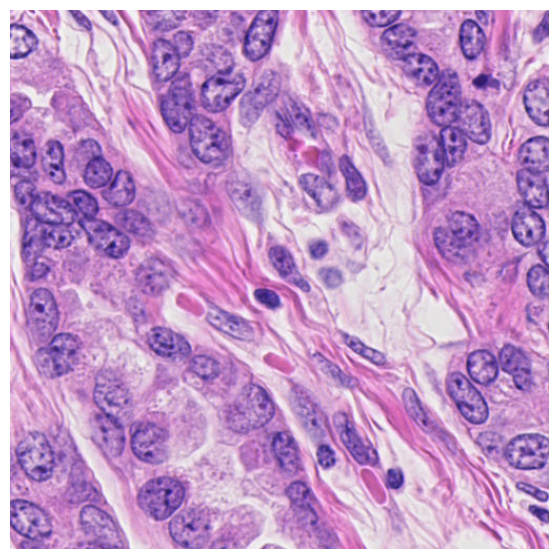

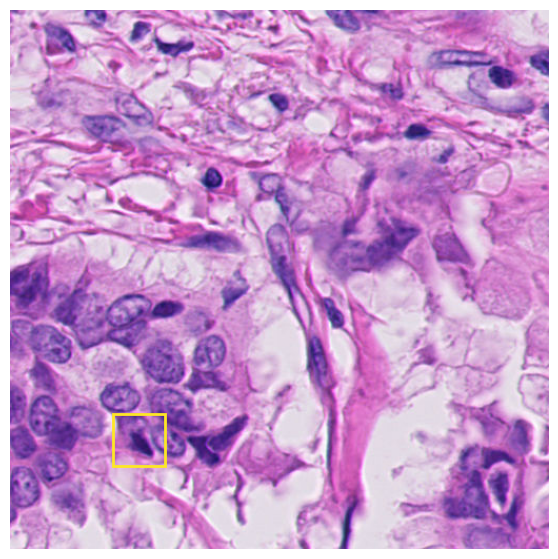

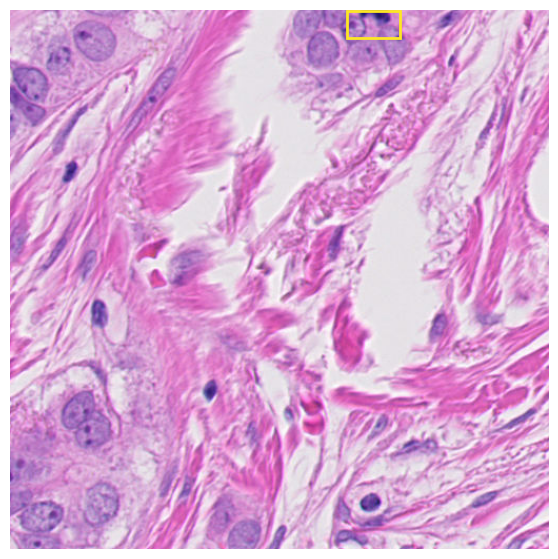

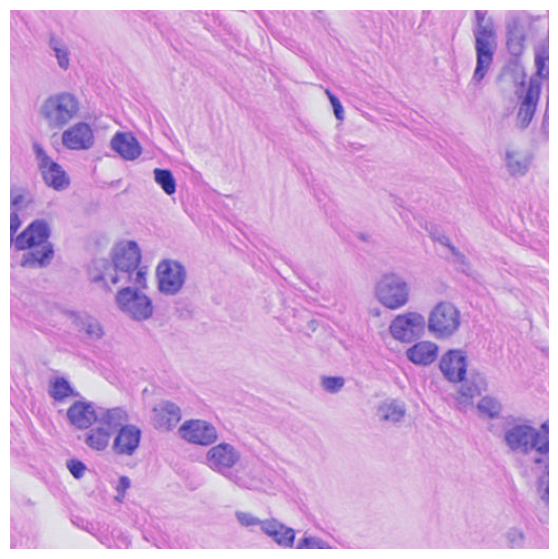

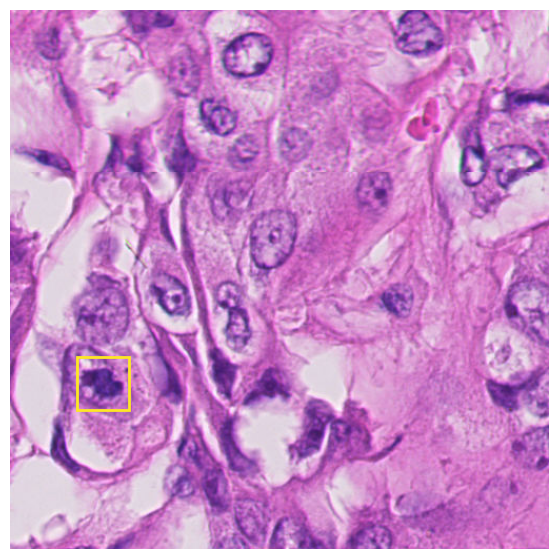

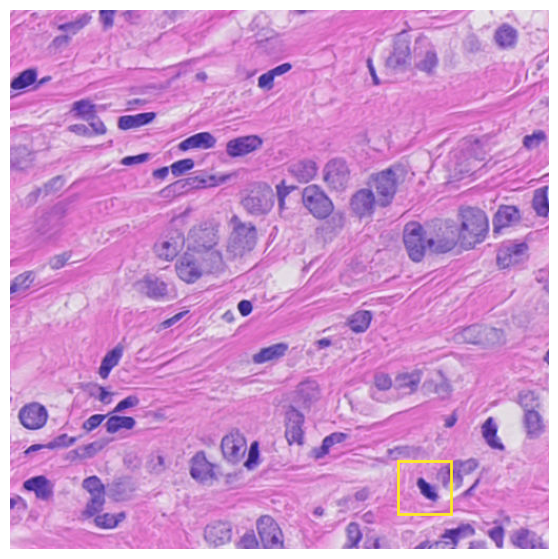

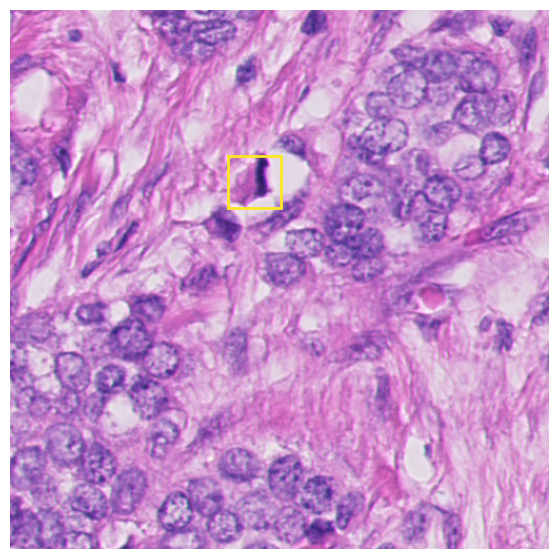

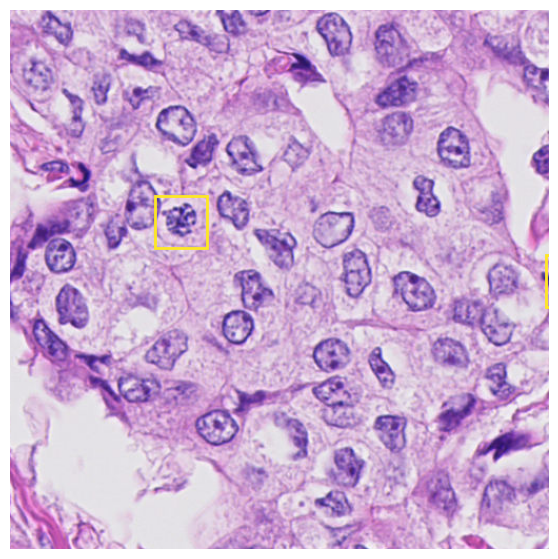

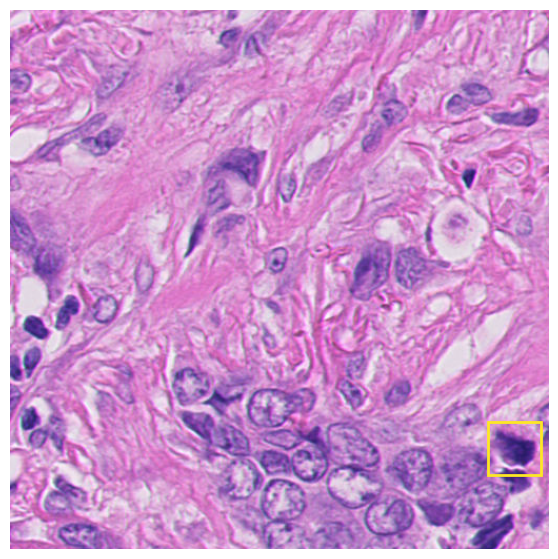

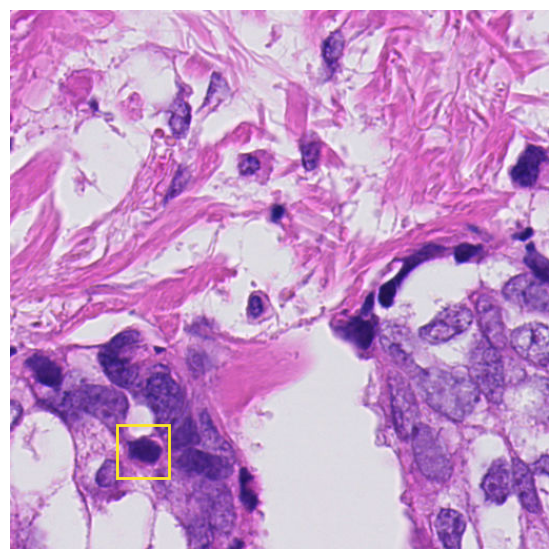

In [6]:
random_indices = random.sample(range(len(train_dataset)), 10)
samples= [train_dataset[i] for i in random_indices]
norm = matplotlib.colors.Normalize(vmin=-1, vmax=1)
legend_colors = matplotlib.colormaps['viridis']

for i in range(len(samples)):
    fig, axes = plt.subplots(1, 1, figsize=(7,7))
    sample = samples[i]
    img = sample[0].cpu().numpy().transpose(1, 2, 0)
    img = img
    axes.imshow(img)
    targets = sample[1]
    bboxes = targets['boxes']
    for b in range(bboxes.shape[0]):
        xmin, ymin, xmax, ymax = bboxes[b].numpy()
        color = legend_colors(norm(targets['labels'][b].numpy()))
        rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor=color, facecolor='none')
        axes.add_patch(rect)
    axes.axis("off")

plt.show()

## Model Preparation

In [7]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

1. Configure model

In [8]:
device = torch.device('cpu')
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=None, weights_backbone=None)
WEIGHTS_FILE = 'checkpoints/fasterrcnn_resnet50_fpn_best.pth'

num_classes = 2  # 1 class (mitotic figure) + background

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the trained weights
model.load_state_dict(torch.load(WEIGHTS_FILE, map_location=device))  ##Load pre trained weights

<All keys matched successfully>

2. Train the model

In [9]:
model.train()
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.00001)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.5)

num_epochs = 1
itr = 1

for epoch in range(num_epochs):
    
    for images, targets, image_ids in train_loader:
        
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)   ##Return the loss

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        print(f"Iteration #{itr} loss: {loss_value}")
        itr += 1
    
    # update the learning rate
    if lr_scheduler is not None:
        lr_scheduler.step()

Iteration #1 loss: 0.323189914226532
Iteration #2 loss: 0.3703048825263977
Iteration #3 loss: 0.2726835608482361
Iteration #4 loss: 0.19626006484031677
Iteration #5 loss: 0.15541543066501617


3. Visualize Predictions

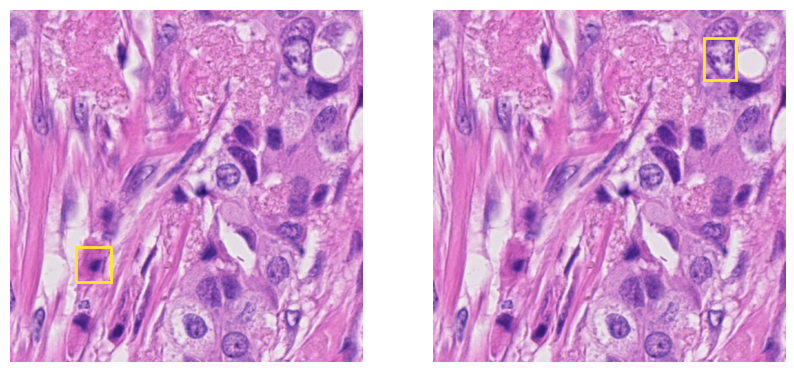

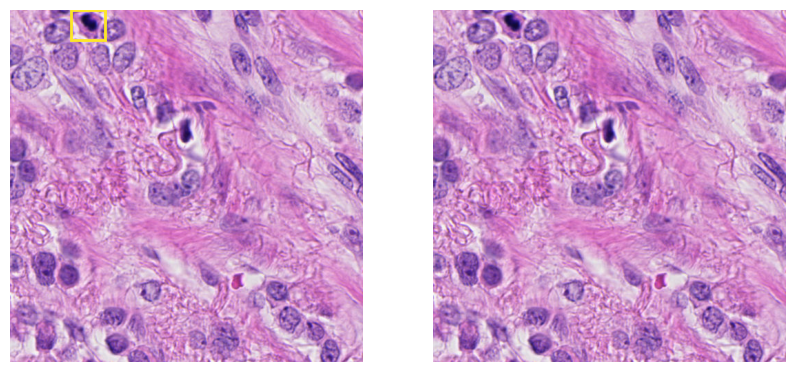

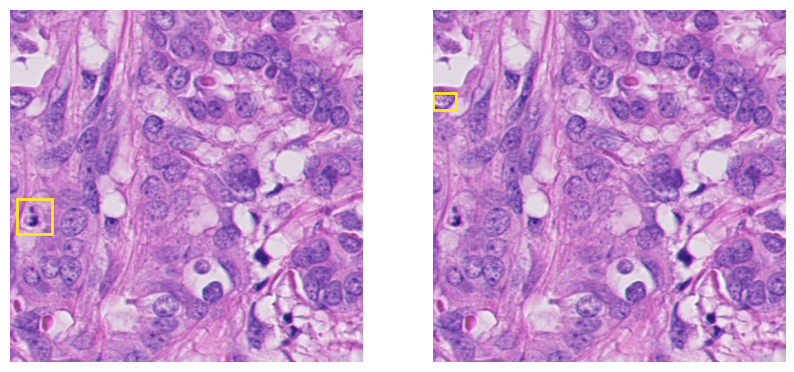

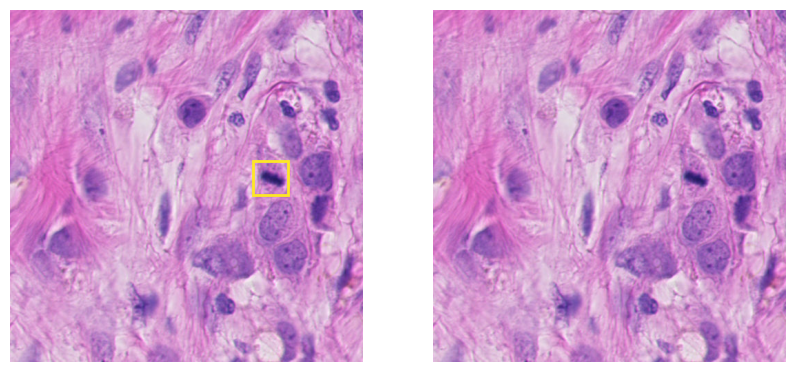

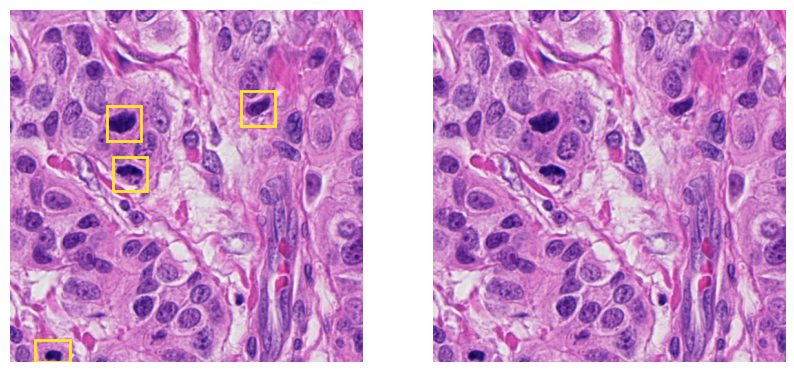

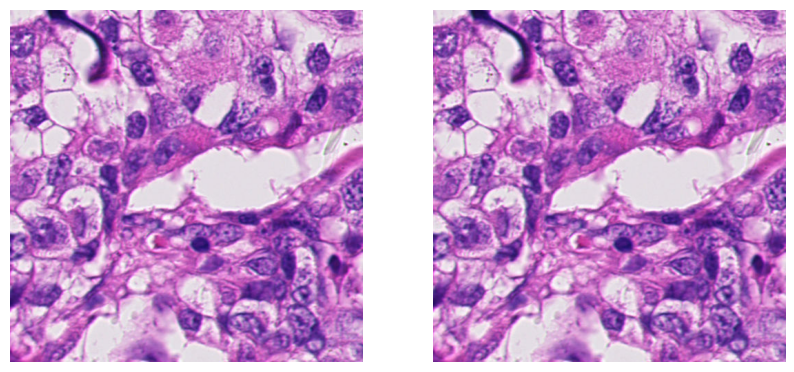

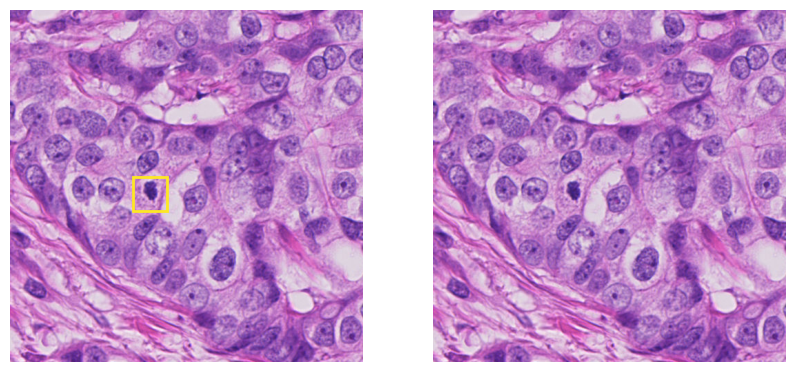

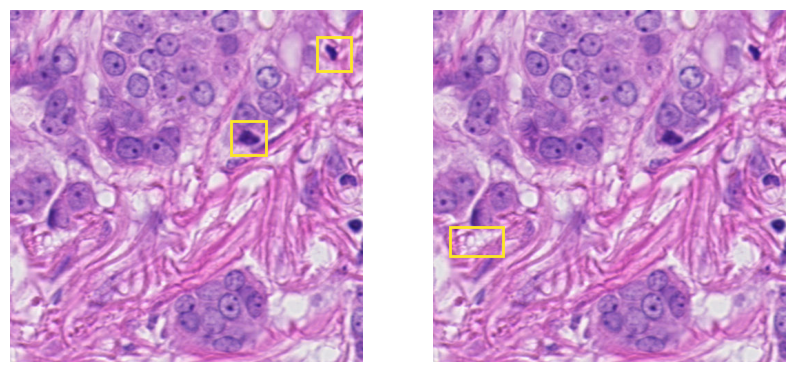

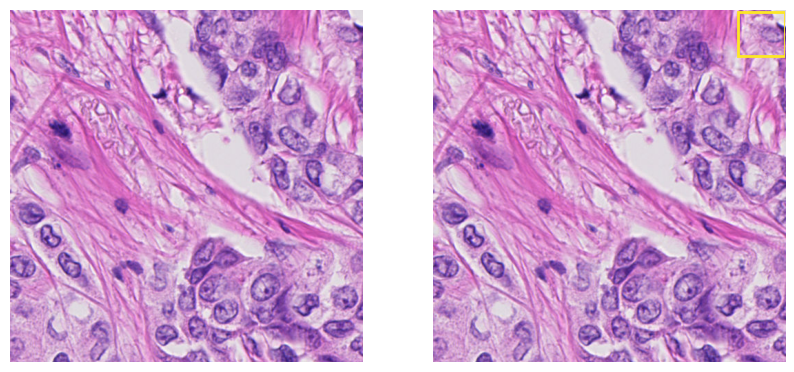

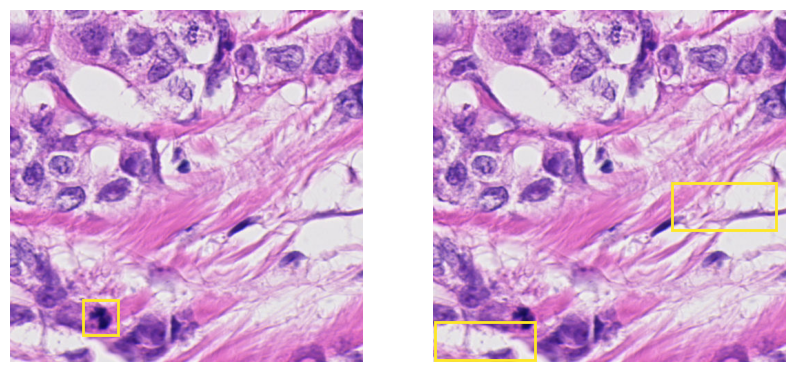

In [10]:
model.eval()
model.to(device)
detection_threshold = 0.2

for images, targets, image_ids in val_loader:    

    images = list(image.to(device) for image in images)
    outputs = model(images)

    for i, image in enumerate(images):

        boxes = outputs[i]['boxes'].data.cpu().numpy()
        scores = outputs[i]['scores'].data.cpu().numpy()
        labels = outputs[i]['labels'].data.cpu().numpy()
        
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        labels = labels[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold] 

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        img = transforms.ToPILImage()(image.cpu())

        # Display the ground truth annotations
        axes[0].imshow(img)
        target = targets[i]
        bboxes_gt = target['boxes']
        for b in range(bboxes_gt.shape[0]):
            xmin, ymin, xmax, ymax = bboxes_gt[b]
            color = legend_colors(norm(target['labels'][b].numpy()))
            rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor=color, facecolor='none')
            axes[0].add_patch(rect)
        axes[0].axis("off")

        # Display the predictions
        axes[1].imshow(img)
        for b in range(boxes.shape[0]):
            xmin, ymin, xmax, ymax = boxes[b]
            color = legend_colors(norm(labels[b]))
            rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
        axes[1].axis("off")

## Use Pre-Trained Model

1. Load weights

In [11]:
checkpoint = torch.load('checkpoints/hbc.ckpt', map_location=device)['state_dict']
checkpoint = {key.split('model.')[1]:value for key, value in checkpoint.items()}
model.load_state_dict(checkpoint, strict=False)  ##Load pre trained weights

_IncompatibleKeys(missing_keys=['backbone.fpn.inner_blocks.0.0.bias', 'backbone.fpn.inner_blocks.1.0.bias', 'backbone.fpn.inner_blocks.2.0.bias', 'backbone.fpn.inner_blocks.3.0.bias', 'backbone.fpn.layer_blocks.0.0.bias', 'backbone.fpn.layer_blocks.1.0.bias', 'backbone.fpn.layer_blocks.2.0.bias', 'backbone.fpn.layer_blocks.3.0.bias'], unexpected_keys=['backbone.fpn.inner_blocks.0.1.weight', 'backbone.fpn.inner_blocks.0.1.bias', 'backbone.fpn.inner_blocks.0.1.running_mean', 'backbone.fpn.inner_blocks.0.1.running_var', 'backbone.fpn.inner_blocks.1.1.weight', 'backbone.fpn.inner_blocks.1.1.bias', 'backbone.fpn.inner_blocks.1.1.running_mean', 'backbone.fpn.inner_blocks.1.1.running_var', 'backbone.fpn.inner_blocks.2.1.weight', 'backbone.fpn.inner_blocks.2.1.bias', 'backbone.fpn.inner_blocks.2.1.running_mean', 'backbone.fpn.inner_blocks.2.1.running_var', 'backbone.fpn.inner_blocks.3.1.weight', 'backbone.fpn.inner_blocks.3.1.bias', 'backbone.fpn.inner_blocks.3.1.running_mean', 'backbone.fpn.i

2. Show Predictions

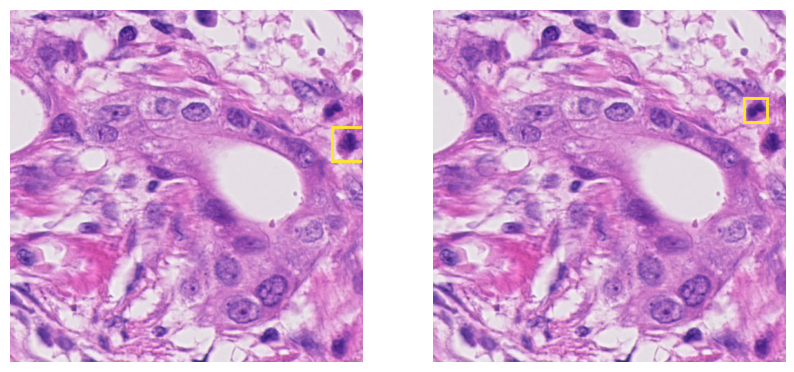

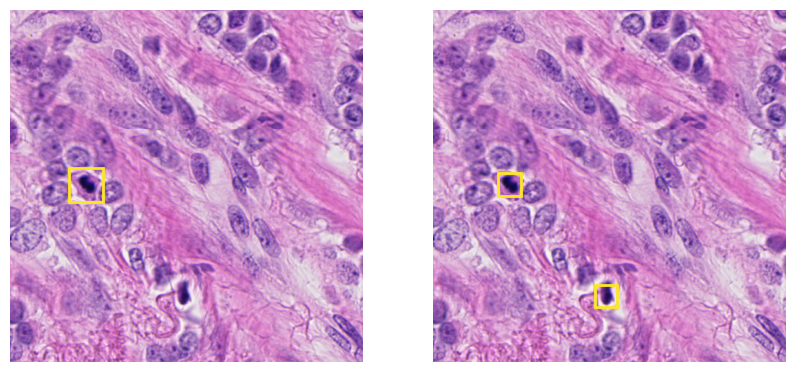

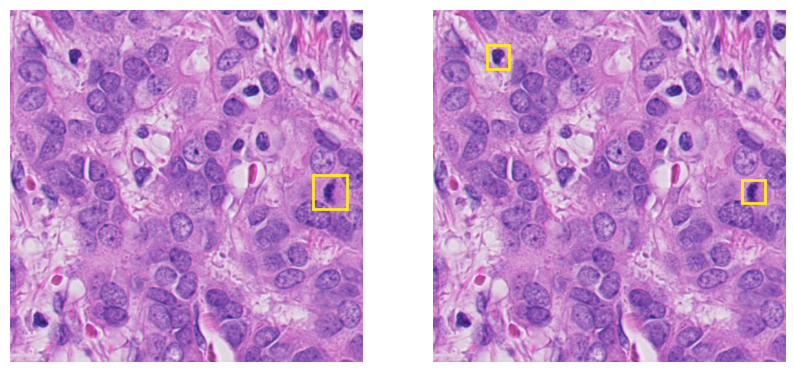

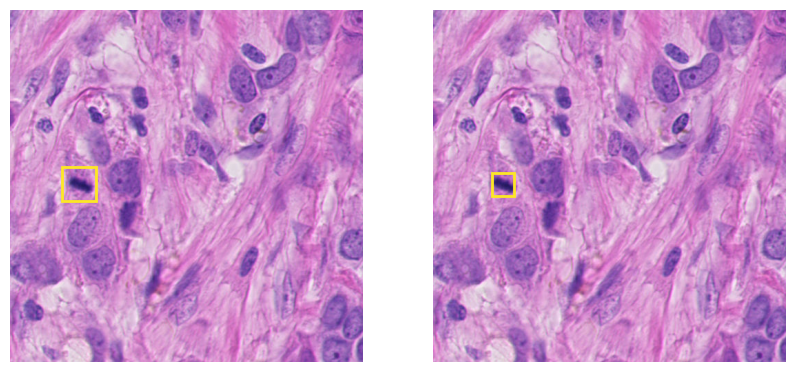

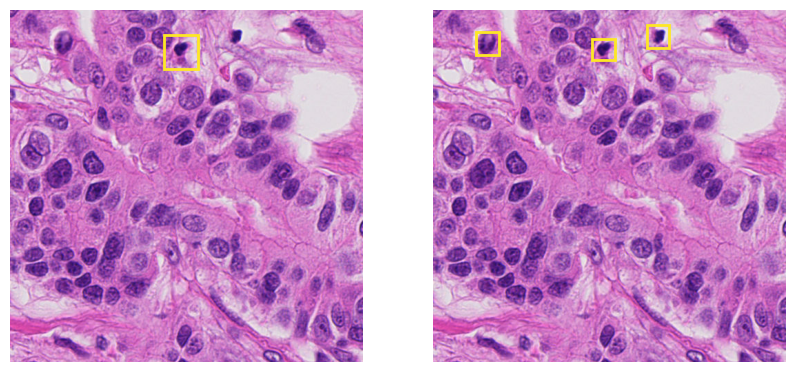

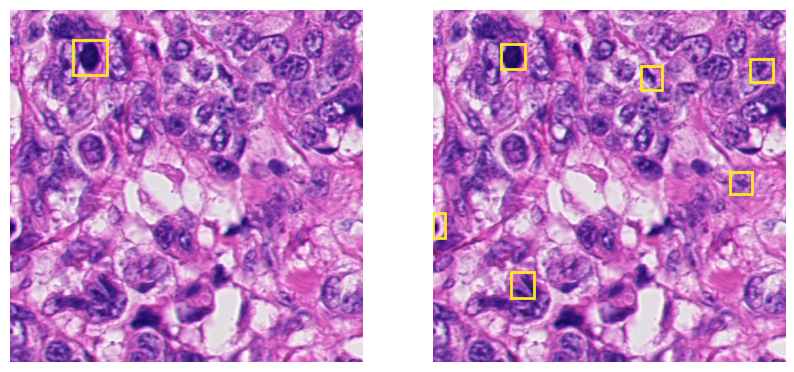

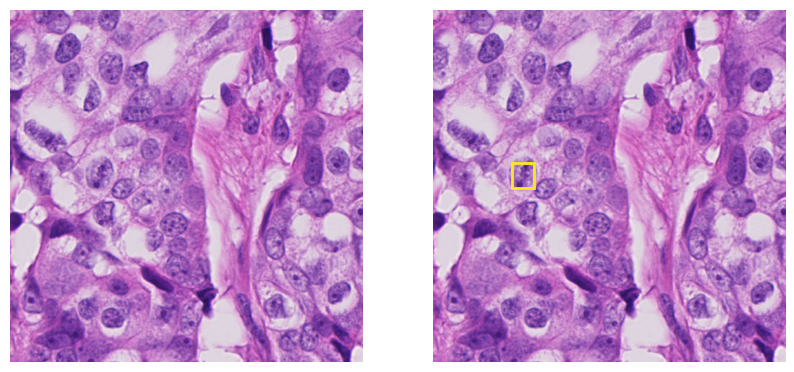

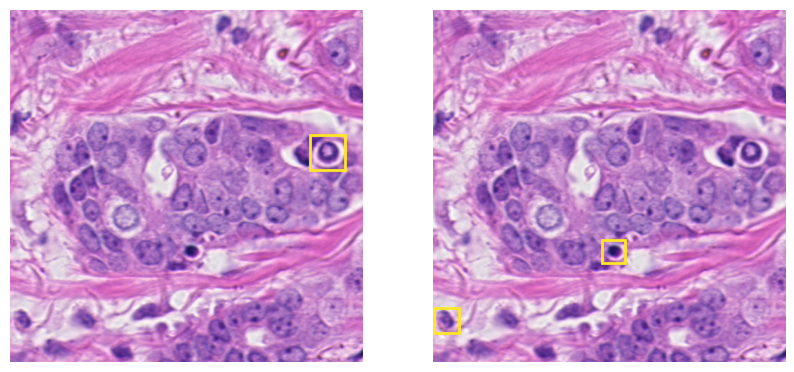

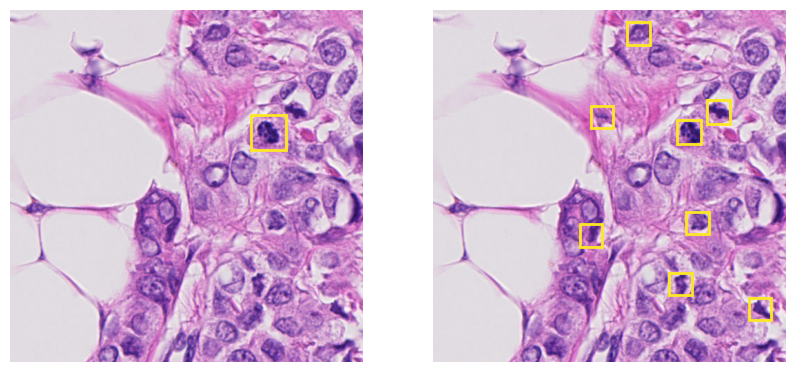

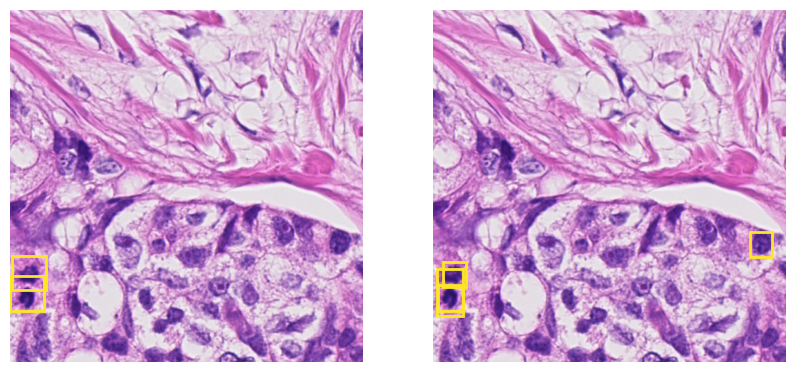

In [13]:
model.eval()
model.to(device)
detection_threshold = 0.1

for images, targets, image_ids in val_loader:    

    images = list(image.to(device) for image in images)
    outputs = model(images)

    for i, image in enumerate(images):

        boxes = outputs[i]['boxes'].data.cpu().numpy()
        scores = outputs[i]['scores'].data.cpu().numpy()
        labels = outputs[i]['labels'].data.cpu().numpy()
        
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        labels = labels[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold] 

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        img = transforms.ToPILImage()(image.cpu())

        # Display the ground truth annotations
        axes[0].imshow(img)
        target = targets[i]
        bboxes_gt = target['boxes']
        for b in range(bboxes_gt.shape[0]):
            xmin, ymin, xmax, ymax = bboxes_gt[b]
            color = legend_colors(norm(target['labels'][b].numpy()))
            rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor=color, facecolor='none')
            axes[0].add_patch(rect)
        axes[0].axis("off")

        # Display the predictions
        axes[1].imshow(img)
        for b in range(boxes.shape[0]):
            xmin, ymin, xmax, ymax = boxes[b]
            color = legend_colors(norm(labels[b]))
            rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
        axes[1].axis("off")